`04_efficientdet_model.ipynb` se probará a cargar el dataset y el modelo de Efficientdet. Posteiormente se tendrá un script automatizado para probar las diferentes configuraciones y folds.

# Importaciones

In [30]:
import sys
from pathlib import Path
import matplotlib.pyplot as plt
import cv2
import torch
import numpy as np
from tqdm.notebook import tqdm

# Asegurar que la ruta src está en el path
PROJECT_ROOT = Path().resolve().parent
sys.path.append(str(PROJECT_ROOT / "src"))

# Importaciones locales
from dataset.efficientdet_dataset import EfficientDetDataset
from models.efficientdet import EfficientDet
from utils.data_augmentations import get_transforms
from utils.file_utils import read_yaml
from engine.train_pipeline import train_efficientdet_pipeline

# Cargamos el dataset

En el notebook anterior `03_split_ds_yolo.ipynb`, donde se tiene el fromato de YOLO se creo 3 experimentos: 

* **Escenario 1** (Balance Total): Separación equitativa en clases (mismos vídeos) y en número de frames. Se aplica submuestreo para extraer la misma cantidad de imágenes de cada vídeo.
* **Escenario 2** (Desbalance Temporal): Separación equitativa por clases, pero usando todos los frames. Esto nos permitirá evaluar si el modelo se sobreajusta a los vídeos más largos.
* **Escenario 3** (Desbalance Total): Separación aleatoria, sin forzar balanceo de clases ni frames. Demostrará empíricamente cómo la falta de estratificación perjudica al modelo en las clases minoritarias

Para cada experimento se creo 4 folds, donde cada fold tiene un fichero de configuración `.yaml` y hace referencia a ficheros de `fold_{i}_{train,val0.txt}` y `text.txt` donde tiene las rutas a las imágenes que hacen refencia a cada uno de los conjuntos, estas rutas son absolutas, y tienen sus etiquetas en la carpeta `labels`. 

Para que EfficientDet pueda interpretar bien las imágenes hay que convertir los datos a un formato que este modelo entienda. Para ello se creo la clase de `EfficientDetDataset`en el script `src/dataset/efficientdet_dataset.py` , donde principalmente se hacen las siguientes modificaciones a las etiquetas de la imagen:
* A diferencia de YOLO, EfficierntDet, guarda la etiqueta 0, para decir si una predicción pertenece al fondo de la imágen, por tanto, a las clases de los objetos identificados en `labels`, se les suma 1.
* Convertir el formato de YOLO normalizado `[class_id, x_center, y_center, width, height]` a:
```json
{
    "bbox": [y_min, x_min, y_max, x_max],
    "cls": target_cls,
    "img_size": torch.tensor([self.img_size, self.img_size], dtype=torch.float32),
    "img_scale": torch.tensor([1.0], dtype=torch.float32),
}
```

## Aumentations

Además, como ya se vió previamente, se está separando un video en frames, y luego para evitar sesgos y que el modelo vea en train los mismos datos con los que se va a evaluar, se separa de manera inteligente train/val/test. Esto conlleva, a que en train se tiene muchas imágenes de un mismo vídeo, entonces para evitar que el modelo se sesgue hay que introducir técnicas de augmentation, es decir, cada vez que el modelo ve una imagen esta pueda sufrir cualquiera de esas modificaciones:


* **RandomResizedCrop**: Introduce variabilidad en la escala y el encuadre. Al recortar una parte de la imagen (entre el 50% y el 100%) y reescalarla al tamaño objetivo, obligamos al modelo a reconocer a los animales (caballos, pingüinos, cerdos) aunque solo vea una parte de ellos o aparezcan a diferentes distancias.
* **HorizontalFlip**: Duplica virtualmente el dataset al permitir que el modelo vea a los animales moviéndose en ambas direcciones (izquierda y derecha), lo cual es fundamental en videos donde la dirección del movimiento suele ser constante.
* **CoarseDropout**: Actúa como un mecanismo de oclusión. Al "borrar" pequeños parches de la imagen (hasta 3 agujeros del 5% del tamaño), el modelo aprende a no depender de una única característica visual específica y a identificar al objeto incluso si parte de él está tapada por vegetación u otros elementos del entorno.
* **ColorJitter**: Simula variaciones en las condiciones de iluminación y calidad de la cámara. Al alterar el brillo, contraste, saturación y tono, el modelo se vuelve robusto frente a cambios en la hora del día, sombras o diferentes configuraciones de color entre los vídeos grabados.
* **Resize** (El "Seguro de Vida"): Garantiza que todas las imágenes que entran a la red neuronal tengan dimensiones idénticas (512x512 en tu caso), independientemente de si se aplicó el recorte aleatorio o no, manteniendo la consistencia necesaria para el entrenamiento por lotes (batches).


Cuando se hace esto, las Bounding Boxes también se ajusten a las augmentations

### Prueba de Aumentations

Seleccionamos una imagen 

In [31]:
IMG_PATH = Path("../dataset/processed/images/horse_1/horse_1_frame_20.jpg")
LBL_PATH = Path("../dataset/processed/labels/horse_1/horse_1_frame_20.txt")
IMG_SIZE = 640

Definimos las etiquetas y los colores que utilizaremos para mostrar la imagen

In [32]:
class_names = {1: "Horse", 2: "Penguin", 3: "Pig"}
colors = {1: 'r', 2: 'c', 3: 'm'}

Función para cargar una imagen 

In [33]:
def load_raw_data(img_path, lbl_path):
    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    boxes, labels = [], []
    if lbl_path.exists():
        with open(lbl_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:
                    c_id = int(parts[0]) + 1 # +1 porque EfficientDet usa 0 como background
                    x_c, y_c, w, h = map(float, parts[1:5])
                    
                    # Convertir YOLO [x_center, y_center, w, h] a Albumentations [x_min, y_min, x_max, y_max]
                    x_min = max(0.0, x_c - w / 2)
                    y_min = max(0.0, y_c - h / 2)
                    x_max = min(1.0, x_c + w / 2)
                    y_max = min(1.0, y_c + h / 2)
                    
                    boxes.append([x_min, y_min, x_max, y_max])
                    labels.append(c_id)
    return img, boxes, labels

img_base, boxes_base, labels_base = load_raw_data(IMG_PATH, LBL_PATH)

Se va a hacer la prueba de mostrar un efecto de aumentation de manera independiente sin ser influenciado por otros efectos. (Pero en la práctica esto puede suceder)

In [37]:
import albumentations as A
import matplotlib.patches as patches

aug_dict = {
    "1. Original (Resize Base)": A.Compose([
        A.Resize(height=IMG_SIZE, width=IMG_SIZE, p=1.0)
    ], bbox_params=A.BboxParams(format='albumentations', label_fields=['class_labels'])),
    
    "2. RandomResizedCrop": A.Compose([
        A.RandomResizedCrop(size=(IMG_SIZE, IMG_SIZE), scale=(0.5, 0.8), p=1.0) # Scale forzado bajo para notar el zoom
    ], bbox_params=A.BboxParams(format='albumentations', label_fields=['class_labels'])),
    
    "3. HorizontalFlip": A.Compose([
        A.Resize(height=IMG_SIZE, width=IMG_SIZE, p=1.0),
        A.HorizontalFlip(p=1.0)
    ], bbox_params=A.BboxParams(format='albumentations', label_fields=['class_labels'])),
    
    "4. CoarseDropout (Oclusión)": A.Compose([
        A.Resize(height=IMG_SIZE, width=IMG_SIZE, p=1.0),
        A.CoarseDropout(
            num_holes_range=(3, 5), # Antes: min_holes=3, max_holes=5
            hole_height_range=(int(IMG_SIZE * 0.05), int(IMG_SIZE * 0.1)), # Rango de altura del parche
            hole_width_range=(int(IMG_SIZE * 0.05), int(IMG_SIZE * 0.1)),  # Rango de anchura del parche
            p=1.0
        )
    ], bbox_params=A.BboxParams(format='albumentations', label_fields=['class_labels'])),
    
    "5. ColorJitter (Iluminación)": A.Compose([
        A.Resize(height=IMG_SIZE, width=IMG_SIZE, p=1.0),
        A.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.2, p=1.0)
    ], bbox_params=A.BboxParams(format='albumentations', label_fields=['class_labels']))
}

Ahora creamos el subplot, donde en cada celda se muestra un efecto, dejando el primer lugar a la imagen original 

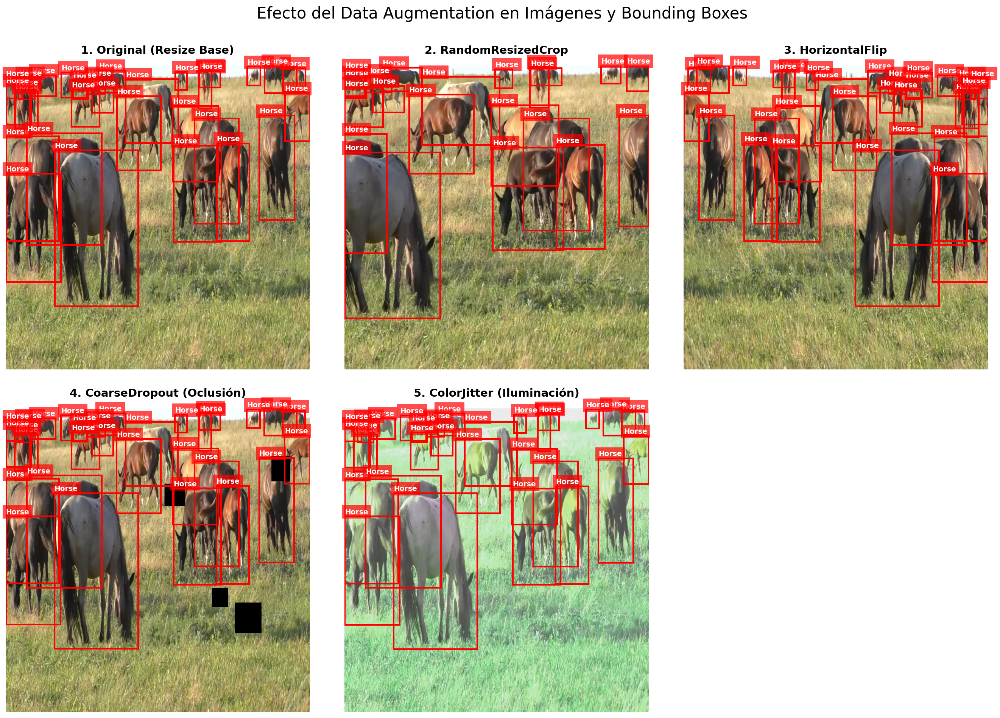

In [38]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12), dpi = 150)
axes = axes.flatten()

for idx, (aug_name, transform) in enumerate(aug_dict.items()):
    ax = axes[idx]
    
    try:
        augmented = transform(image=img_base, bboxes=boxes_base, class_labels=labels_base)
        img_aug = augmented['image']
        boxes_aug = augmented['bboxes']
        labels_aug = augmented['class_labels']
    except Exception as e:
        print(f"Error aplicando {aug_name}: {e}")
        continue
        
    ax.imshow(img_aug)
    
    ax.set_title(aug_name, fontsize=14, fontweight='bold', pad=15) 
    ax.axis('off')
    
    h, w, _ = img_aug.shape
    for box, cls_id in zip(boxes_aug, labels_aug):
        x_min_n, y_min_n, x_max_n, y_max_n = box
        
        x_min = x_min_n * w
        y_min = y_min_n * h
        box_w = (x_max_n - x_min_n) * w
        box_h = (y_max_n - y_min_n) * h
        
        color = colors.get(cls_id, 'g')
        name = class_names.get(cls_id, f"ID:{cls_id}")
        
        rect = patches.Rectangle((x_min, y_min), box_w, box_h, linewidth=2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        ax.text(x_min, y_min - 5, name, color='white', fontsize=9, fontweight='bold', bbox=dict(facecolor=color, alpha=0.7, edgecolor='none'))

axes[5].axis('off')
plt.tight_layout(h_pad=3.0, w_pad=2.0) 

plt.suptitle("Efecto del Data Augmentation en Imágenes y Bounding Boxes", fontsize=20, y=1.05) 
plt.savefig('docs/images/aumentations.pdf', format = 'pdf', dpi=150, bbox_inches='tight')
plt.show()

### Mosaicos

De manera complementaria, se introduce un nuevo concepto, que es el de los mosaicos, que es complementario a lo mostrado anteriormente. Este efecvto lo que hace es unir diferentes imágenes pertenecientes a un mismo batch, esto permite generar una imagen de entrenamiento en el que cada cuarto de la imagen, pertenece a una distinta. 


En la siguiente sección se visualizará este ejemplo, llamando directamente y creando el conjunto de datos del dataset.

## Cargamos el dataset

Cargamos el primer dataset el escenario 1, fold 1, aplciamos albumentations y forzamos a que tenga activado los mosaicos

Primero configuramos la ruta

In [7]:
yaml_config_path = PROJECT_ROOT / "dataset" / "processed" / "experiments" / "set1_balanced_subsampled" / "fold_1_config.yaml"
config = read_yaml(yaml_config_path)
class_names = {i: name for i, name in enumerate(config['names'])}
img_size = 640

print(f'YAML Config: {yaml_config_path}')
print(f"🚀 Entorno configurado. Detectando clases: {list(class_names.values())}")

YAML Config: /root/MURIA/Object_Recognition/dataset/processed/experiments/set1_balanced_subsampled/fold_1_config.yaml
🚀 Entorno configurado. Detectando clases: ['horse', 'penguin', 'pig']


A continuación se debe definir los parámetros principales de las transformaciones de augmentations que se utilizarán Si seleccionamos el modo `'val'` o `'test'`solo se aplicará el efecto del target size, que es el que realiza el reescalado de la imagen.

In [8]:
train_transforms=get_transforms(
    mode='train',
    target_size=img_size, 
    random_crop_prob=0.5,
    random_flip_prob=0.5,
    random_coarse_dropout_prob=0.1,
    random_color_jitter_prob=0.4)

/root/MURIA/Object_Recognition/src/utils/data_augmentations.py:37: UserWarning: Argument(s) 'max_holes, max_height, max_width' are not valid for transform CoarseDropout
  A.CoarseDropout(


Cargamos los datos de entrenamiento.

In [9]:
mosaic_prob = 0.4
train_ds = EfficientDetDataset(
    Path(config['train']), 
    img_size=img_size, 
    transforms=train_transforms,
    is_train=True,
    mosaic_prob=mosaic_prob)


Visualización del efecto del mosaic y augmentations

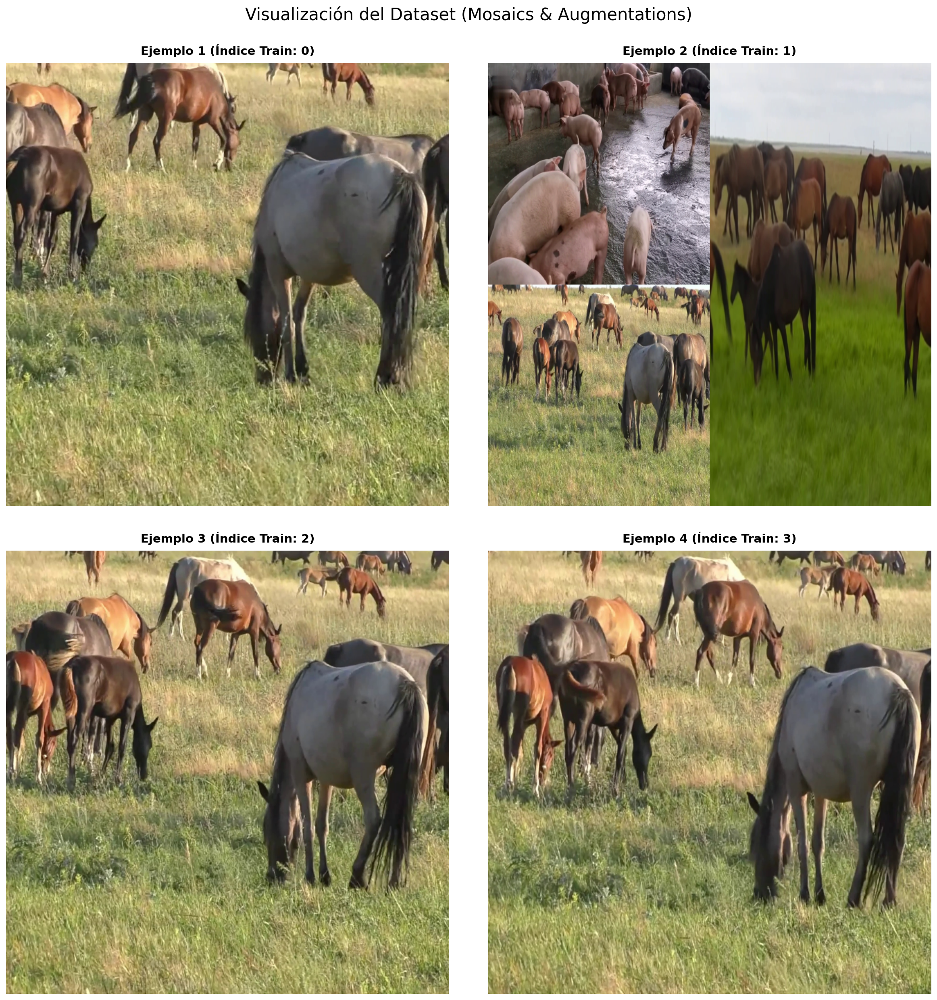

In [10]:
fig, axes = plt.subplots(2, 2, figsize=(16, 16), dpi = 150)
axes = axes.flatten()
mean, std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])

for i, idx in enumerate([0,1,2,3]):
    ax = axes[i]
    
    img_tensor, target = train_ds[idx]
    
    img_np = img_tensor.permute(1, 2, 0).numpy()
    img_np = (img_np * std) + mean
    img_np = (np.clip(img_np, 0, 1) * 255).astype("uint8").copy()


    ax.imshow(img_np)
    ax.set_title(f"Ejemplo {i+1} (Índice Train: {idx})", fontsize=14, fontweight='bold', pad=10)
    ax.axis('off')

plt.tight_layout(h_pad=3.0, w_pad=2.0)
plt.suptitle("Visualización del Dataset (Mosaics & Augmentations)", fontsize=20, y=1.03)
plt.savefig( 'docs/images/ds_aumentations_mosaics.pdf', format='pdf', dpi=150, bbox_inches='tight')
plt.show()

# Cargamos el modelo 

El paper de Google de [EfficientDet](https://github.com/google/automl/tree/master/efficientdet) presenta los diferentes modelos que se pueden cargar, que están basados en TensorFlow.

* `tf_efficientdet_d0`: Tamaño de imagen nativo 512x512.
* `tf_efficientdet_d1`: Tamaño nativo 640x640. 
* `tf_efficientdet_d2`: Tamaño nativo 768x768.
* `tf_efficientdet_d3`: Tamaño nativo 896x896.
* `tf_efficientdet_d4`: Tamaño nativo 1024x1024.
* `tf_efficientdet_d5`: Tamaño nativo 1280x1280.
* `tf_efficientdet_d6`: Tamaño nativo 1280x1280.
* `tf_efficientdet_d7` / tf_efficientdet_d7x: Tamaño nativo 1536x1536.


Pero un usuario adaptó los modelos a Pytorch en la librería [effdet](https://github.com/rwightman/efficientdet-pytorch/tree/master)

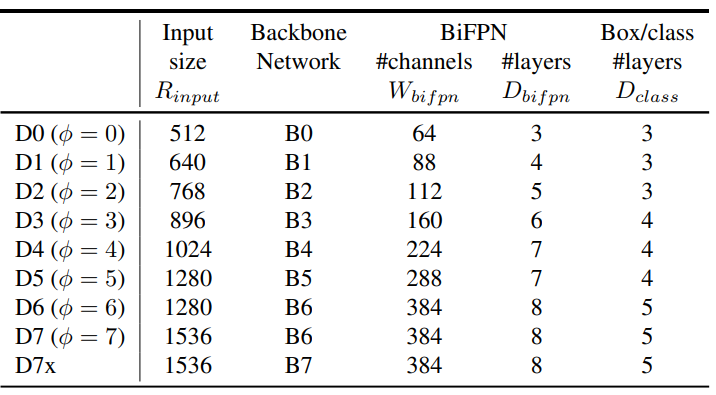

A continuación se muestra las funciones básicas que puede realizar el modelo

In [ ]:
modelos_disponibles = {
    "tf_efficientdet_d0": {
        "input_size": 512,
        "backbone": "B0"
    },
    "tf_efficientdet_d1": {
        "input_size": 640,
        "backbone": "B1"
    },
    "tf_efficientdet_d2": {
        "input_size": 768,
        "backbone": "B2"
    },
    "tf_efficientdet_d3": {
        "input_size": 896,
        "backbone": "B3"
    },
    "tf_efficientdet_d4": {
        "input_size": 1024,
        "backbone": "B4"
    },
    "tf_efficientdet_d5": {
        "input_size": 1280,
        "backbone": "B5"
    },
    "tf_efficientdet_d6": {
        "input_size": 1280,
        "backbone": "B6"
    },
    "tf_efficientdet_d7": {
        "input_size": 1536,
        "backbone": "B6"
    },
    "tf_efficientdet_d7x": {
        "input_size": 1536,
        "backbone": "B7"
    }
}

In [ ]:
num_classes = len(class_names)
dropout_rate = 0.2
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Una vez cargado el modelo, se puede utilziar el modelo para entrenar haciendo transfer learnign, fine tuning, predicciones.. y calcular en cada momento su tamaño en memoria, el número total de parámetros y el númeor de parámetros entrenables en cada momento.

In [29]:
for architecture in modelos_disponibles:
    model = EfficientDet(
        num_classes=num_classes, 
        img_size=modelos_disponibles[architecture]['input_size'], 
        architecture=architecture, 
        is_training=True, 
        pretrained=True, 
        dropout_rate = dropout_rate
        ).to(device)

    print(f'Resumen del modeo en estado TransferLearning')
    model.freeze_backbone()
    print(model.get_model_info())

    print(f'Resumen del modeo en estado FineTuning')
    model.unfreeze_all()
    print(model.get_model_info())

Resumen del modeo en estado TransferLearning
✅ Backbone frozen, head unfrozen
{'architecture': 'tf_efficientdet_d0', 'num_classes': 3, 'img_size': 512, 'is_training': True, 'total_params': 3829172, 'trainable_params': 37503, 'trainable_params_percentage': 0.98, 'model_size_GB': 0.02}
Resumen del modeo en estado FineTuning
✅ All parameters unfrozen
{'architecture': 'tf_efficientdet_d0', 'num_classes': 3, 'img_size': 512, 'is_training': True, 'total_params': 3829172, 'trainable_params': 3829172, 'trainable_params_percentage': 100.0, 'model_size_GB': 0.02}
Resumen del modeo en estado TransferLearning
✅ Backbone frozen, head unfrozen
{'architecture': 'tf_efficientdet_d1', 'num_classes': 3, 'img_size': 640, 'is_training': True, 'total_params': 6556211, 'trainable_params': 64215, 'trainable_params_percentage': 0.98, 'model_size_GB': 0.03}
Resumen del modeo en estado FineTuning
✅ All parameters unfrozen
{'architecture': 'tf_efficientdet_d1', 'num_classes': 3, 'img_size': 640, 'is_training': T